# EDA STORM o TORMENTAS

Usando dataset ../../Data/03Limpio/03desastreslimpio.csv

## 1. IMPORTAR LIBRERÍAS

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from geopy.geocoders import Nominatim
from time import sleep

In [3]:
# para mostrar todas las columnas y todas las filas
pd.options.display.max_columns = None
pd.options.display.max_rows = None

## 2. CARGAR DATASET

In [4]:
df = pd.read_csv('../../Data/03Limpio/03desastreslimpio.csv')


In [3]:
df.head(5)

,Dis No,Year,Seq,Disaster Subgroup,Disaster Type,Disaster Subtype,Country,ISO,Region,Continent,...,Longitude,Start Year,Start Month,Start Day,End Year,End Month,End Day,Total Deaths,Total Affected,Total Damages Adj
0,1900-9002-CPV,1900,9002,Climatological,Drought,Drought,Cabo Verde,CPV,Western Africa,Africa,...,NaN,1900,0,0,1900,0,0,11000,0,0
1,1900-9001-IND,1900,9001,Climatological,Drought,Drought,India,IND,Southern Asia,Asia,...,NaN,1900,0,0,1900,0,0,1250000,0,0
2,1902-0012-GTM,1902,12,Geophysical,Earthquake,Ground movement,Guatemala,GTM,Central America,Americas,...,-91,1902,4,18,1902,4,18,2000,0,843726
3,1902-0003-GTM,1902,3,Geophysical,Volcanic activity,Ash fall,Guatemala,GTM,Central America,Americas,...,NaN,1902,4,8,1902,4,8,1000,0,0
4,1902-0010-GTM,1902,10,Geophysical,Volcanic activity,Ash fall,Guatemala,GTM,Central America,Americas,...,NaN,1902,10,24,1902,10,24,6000,0,0


In [4]:
df.shape

(16636, 26)

In [5]:
df.columns

Index(['Dis No', 'Year', 'Seq', 'Disaster Subgroup', 'Disaster Type',
       'Disaster Subtype', 'Country', 'ISO', 'Region', 'Continent', 'Location',
       'Origin', 'Associated Dis', 'Dis Mag Value', 'Dis Mag Scale',
       'Latitude', 'Longitude', 'Start Year', 'Start Month', 'Start Day',
       'End Year', 'End Month', 'End Day', 'Total Deaths', 'Total Affected',
       'Total Damages Adj'],
      dtype='object')

## ANÁLISIS BÁSICO

In [6]:
df.head(3)

,Dis No,Year,Seq,Disaster Subgroup,Disaster Type,Disaster Subtype,Country,ISO,Region,Continent,...,Longitude,Start Year,Start Month,Start Day,End Year,End Month,End Day,Total Deaths,Total Affected,Total Damages Adj
0,1900-9002-CPV,1900,9002,Climatological,Drought,Drought,Cabo Verde,CPV,Western Africa,Africa,...,NaN,1900,0,0,1900,0,0,11000,0,0
1,1900-9001-IND,1900,9001,Climatological,Drought,Drought,India,IND,Southern Asia,Asia,...,NaN,1900,0,0,1900,0,0,1250000,0,0
2,1902-0012-GTM,1902,12,Geophysical,Earthquake,Ground movement,Guatemala,GTM,Central America,Americas,...,-91,1902,4,18,1902,4,18,2000,0,843726


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16636 entries, 0 to 16635
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Dis No             16636 non-null  object
 1   Year               16636 non-null  int64 
 2   Seq                16636 non-null  int64 
 3   Disaster Subgroup  16636 non-null  object
 4   Disaster Type      16636 non-null  object
 5   Disaster Subtype   13313 non-null  object
 6   Country            16636 non-null  object
 7   ISO                16636 non-null  object
 8   Region             16636 non-null  object
 9   Continent          16636 non-null  object
 10  Location           14825 non-null  object
 11  Origin             4085 non-null   object
 12  Associated Dis     3593 non-null   object
 13  Dis Mag Value      16636 non-null  int64 
 14  Dis Mag Scale      15416 non-null  object
 15  Latitude           2775 non-null   object
 16  Longitude          2775 non-null   objec

In [8]:
df.columns

Index(['Dis No', 'Year', 'Seq', 'Disaster Subgroup', 'Disaster Type',
       'Disaster Subtype', 'Country', 'ISO', 'Region', 'Continent', 'Location',
       'Origin', 'Associated Dis', 'Dis Mag Value', 'Dis Mag Scale',
       'Latitude', 'Longitude', 'Start Year', 'Start Month', 'Start Day',
       'End Year', 'End Month', 'End Day', 'Total Deaths', 'Total Affected',
       'Total Damages Adj'],
      dtype='object')

## 3. FILTRO PARA STORM

In [5]:
storm_filter = (df['Disaster Type'] == 'Storm')
df_storm = df[storm_filter]

In [10]:
df_storm.head(10)

,Dis No,Year,Seq,Disaster Subgroup,Disaster Type,Disaster Subtype,Country,ISO,Region,Continent,...,Longitude,Start Year,Start Month,Start Day,End Year,End Month,End Day,Total Deaths,Total Affected,Total Damages Adj
7,1904-0003-BGD,1904,3,Meteorological,Storm,Tropical cyclone,Bangladesh,BGD,Southern Asia,Asia,...,NaN,1904,11,0,1904,11,0,0,0,0
14,1906-0015-HKG,1906,15,Meteorological,Storm,Tropical cyclone,Hong Kong,HKG,Eastern Asia,Asia,...,NaN,1906,9,8,1906,9,8,10000,0,649981
18,1909-0010-BGD,1909,10,Meteorological,Storm,Tropical cyclone,Bangladesh,BGD,Southern Asia,Asia,...,NaN,1909,10,15,1909,10,15,172,0,0
19,1909-0013-BGD,1909,13,Meteorological,Storm,Tropical cyclone,Bangladesh,BGD,Southern Asia,Asia,...,NaN,1909,12,0,1909,12,0,0,0,0
22,1909-0012-HTI,1909,12,Meteorological,Storm,Tropical cyclone,Haiti,HTI,Caribbean,Americas,...,NaN,1909,11,12,1909,11,12,150,0,0
32,1911-0004-BGD,1911,4,Meteorological,Storm,Tropical cyclone,Bangladesh,BGD,Southern Asia,Asia,...,NaN,1911,4,0,1911,4,0,0,0,0
35,1912-0021-CAN,1912,21,Meteorological,Storm,Convective storm,Canada,CAN,Northern America,Americas,...,NaN,1912,6,30,1912,6,30,28,2700,151289
36,1912-0005-CHN,1912,5,Meteorological,Storm,Tropical cyclone,China,CHN,Eastern Asia,Asia,...,NaN,1912,8,0,1912,8,0,50000,0,0
40,1915-0006-HTI,1915,6,Meteorological,Storm,Tropical cyclone,Haiti,HTI,Caribbean,Americas,...,NaN,1915,8,12,1915,8,12,1600,0,0
41,1916-0004-IND,1916,4,Meteorological,Storm,Tropical cyclone,India,IND,Southern Asia,Asia,...,NaN,1916,11,21,1916,11,21,300,0,0


### 3.1. ANÁLISIS BÁSICO PARA DF_STORM

In [11]:
df_storm.shape # Tenemos 4618 eventos de tormentas

(4618, 26)

In [12]:
df_storm.isnull().sum()

Dis No                  0
Year                    0
Seq                     0
Disaster Subgroup       0
Disaster Type           0
Disaster Subtype      815
Country                 0
ISO                     0
Region                  0
Continent               0
Location              736
Origin               4570
Associated Dis       3273
Dis Mag Value           0
Dis Mag Scale           0
Latitude             4504
Longitude            4504
Start Year              0
Start Month             0
Start Day               0
End Year                0
End Month               0
End Day                 0
Total Deaths            0
Total Affected          0
Total Damages Adj       0
dtype: int64

In [14]:
df_storm.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4618 entries, 7 to 16633
Data columns (total 26 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Dis No             4618 non-null   object
 1   Year               4618 non-null   int64 
 2   Seq                4618 non-null   int64 
 3   Disaster Subgroup  4618 non-null   object
 4   Disaster Type      4618 non-null   object
 5   Disaster Subtype   3803 non-null   object
 6   Country            4618 non-null   object
 7   ISO                4618 non-null   object
 8   Region             4618 non-null   object
 9   Continent          4618 non-null   object
 10  Location           3882 non-null   object
 11  Origin             48 non-null     object
 12  Associated Dis     1345 non-null   object
 13  Dis Mag Value      4618 non-null   int64 
 14  Dis Mag Scale      4618 non-null   object
 15  Latitude           114 non-null    object
 16  Longitude          114 non-null    object

### 3.2. ANÁLISIS GEOGRÁFICO DE TORMENTAS
Usando columnas Location, Country, Region, Continent

### * Análisis básico

In [15]:
df_storm_geografical = df_storm[['Location', 'Country', 'Region', 'Continent']]
df_storm_geografical.shape

(4618, 4)

In [16]:
df_storm_geografical.head(5)

,Location,Country,Region,Continent
7,Chittagong,Bangladesh,Southern Asia,Asia
14,NaN,Hong Kong,Eastern Asia,Asia
18,Bakerganj,Bangladesh,Southern Asia,Asia
19,West Sundarbans,Bangladesh,Southern Asia,Asia
22,"Cul de Sac,Leogane",Haiti,Caribbean,Americas


In [17]:
df_storm_geografical.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4618 entries, 7 to 16633
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Location   3882 non-null   object
 1   Country    4618 non-null   object
 2   Region     4618 non-null   object
 3   Continent  4618 non-null   object
dtypes: object(4)
memory usage: 180.4+ KB


In [18]:
df_storm_geografical.isnull().sum()

Location     736
Country        0
Region         0
Continent      0
dtype: int64

### * Distribución geográfica de tormentas

** Continente

In [19]:
df_storm_geografical['Continent'].value_counts()

Asia        1923
Americas    1497
Europe       569
Oceania      317
Africa       312
Name: Continent, dtype: int64

** Región

In [20]:
df_storm_geografical['Region'].value_counts()

Northern America             773
Eastern Asia                 754
South-Eastern Asia           625
Southern Asia                472
Caribbean                    373
Western Europe               261
Central America              255
Eastern Africa               191
Melanesia                    118
Northern Europe              105
Australia and New Zealand    102
Eastern Europe               102
South America                 96
Southern Europe               96
Polynesia                     70
Western Asia                  67
Southern Africa               45
Western Africa                36
Micronesia                    27
Middle Africa                 21
Northern Africa               19
Russian Federation             5
Central Asia                   5
Name: Region, dtype: int64

** Países

In [21]:
df_storm_geografical['Country'].value_counts()

United States of America (the)                                716
Philippines (the)                                             382
China                                                         321
India                                                         206
Japan                                                         191
Bangladesh                                                    184
Viet Nam                                                      131
Mexico                                                        124
Taiwan (Province of China)                                     87
Australia                                                      85
France                                                         76
Madagascar                                                     68
Hong Kong                                                      64
Korea (the Republic of)                                        62
Canada                                                         51
Cuba      

** Ubicación

In [22]:
df_storm_geografical['Location'].value_counts()

Taiwan Sheng province                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

### * Visualización de la distribución geográfica de tormentas

** Distribución de sequías por continente

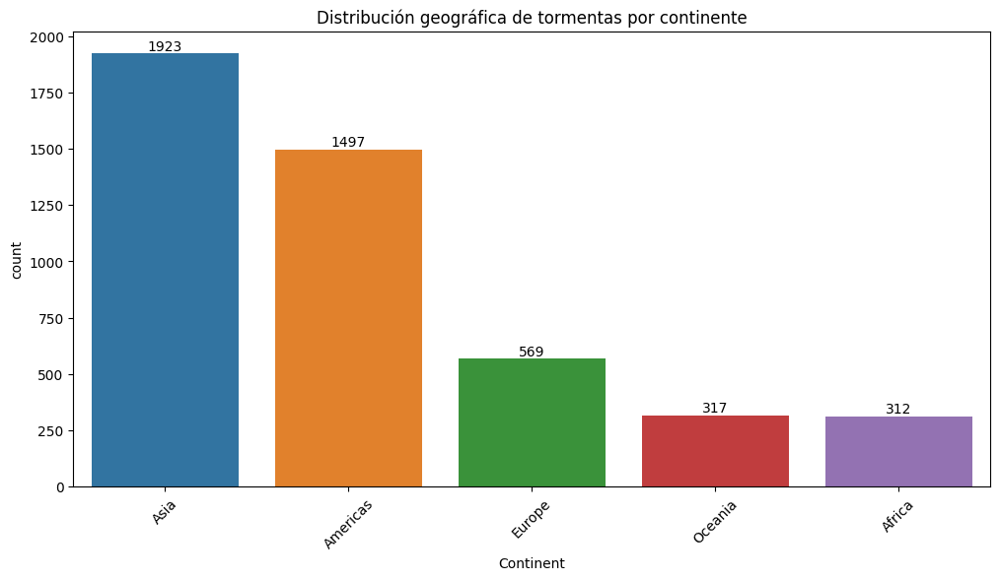

In [23]:
plt.figure(figsize=(12,6))
order = df_storm_geografical['Continent'].value_counts(ascending=False).index
ax =sns.countplot(data=df_storm_geografical, x= 'Continent', order=order)
plt.title('Distribución geográfica de tormentas por continente')
plt.xticks(rotation=45)
ax.bar_label(ax.containers[0]); 

Asia es el continente con un mayor número de tormentas contabilizadas, 1923, seguida del continente americano con 1497 eventos. Entre ambos continentes contabilizan el 74% del total. 

** Distribución de tormentas por región

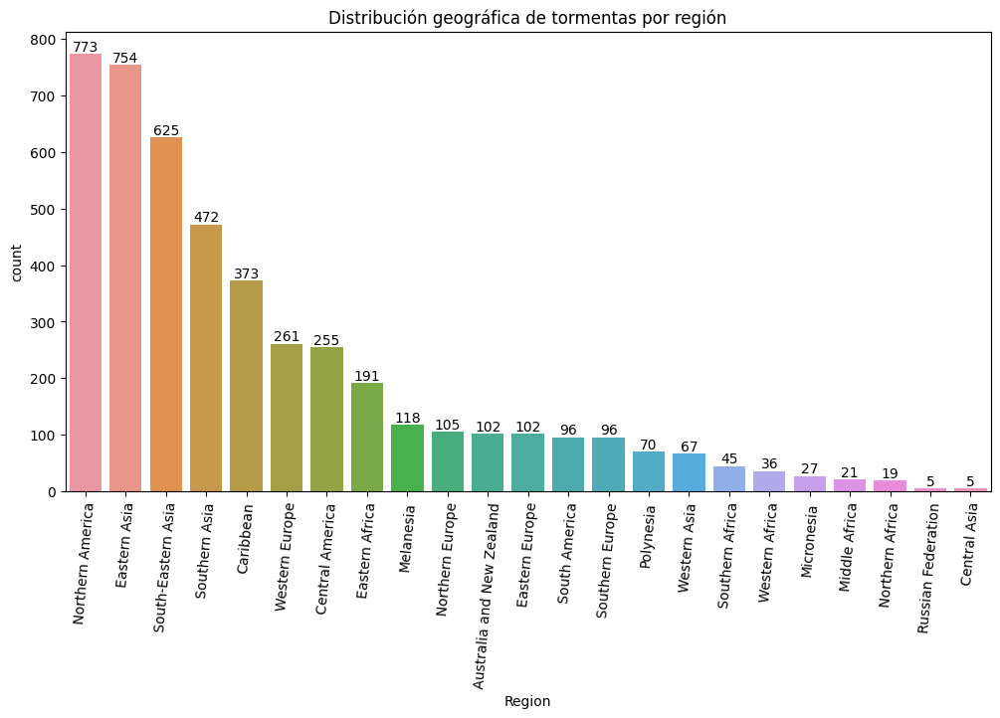

In [24]:
plt.figure(figsize=(12,6))
order = df_storm_geografical['Region'].value_counts(ascending=False).index
ax =sns.countplot(data=df_storm_geografical, x= 'Region', order=order)
plt.title('Distribución geográfica de tormentas por región')
plt.xticks(rotation=85)
ax.bar_label(ax.containers[0]); 

El norte de América y el este de Asia son las dos regiones con mayor incidencia de este tipo de desastres, seguidos del SE y S de Asia

** Distribución de tormentas por país

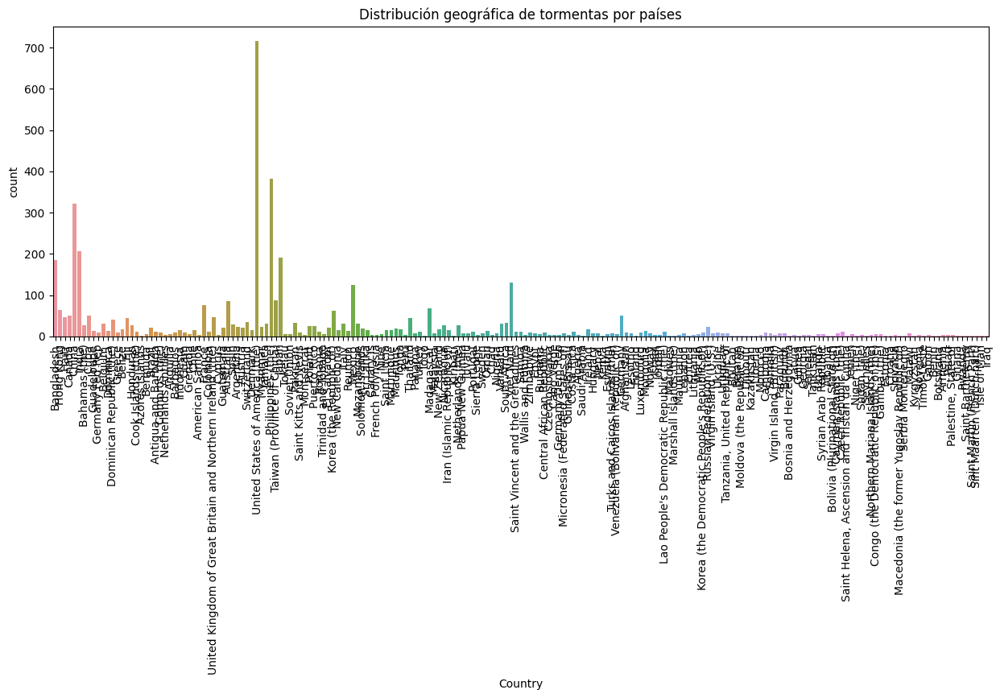

In [25]:
plt.figure(figsize=(15,5))
ax =sns.countplot(data=df_storm_geografical, x= 'Country')
plt.title('Distribución geográfica de tormentas por países')
plt.xticks(rotation=90)
plt.show()


In [26]:
top_10_countries = df_storm_geografical['Country'].value_counts().head(10)
top_10_countries

United States of America (the)    716
Philippines (the)                 382
China                             321
India                             206
Japan                             191
Bangladesh                        184
Viet Nam                          131
Mexico                            124
Taiwan (Province of China)         87
Australia                          85
Name: Country, dtype: int64

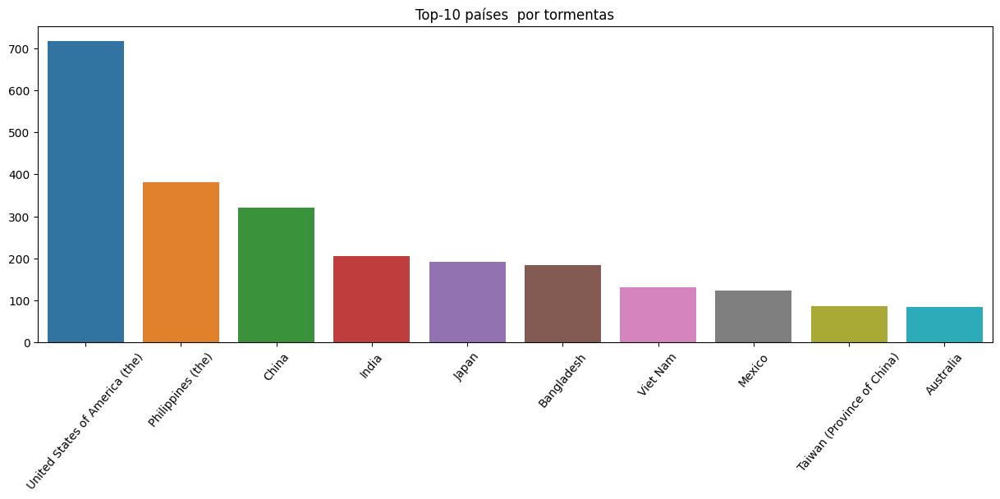

In [27]:
plt.figure(figsize=(15,5))
ax =sns.barplot(y=top_10_countries.values, x=top_10_countries.index)
plt.title('Top-10 países  por tormentas')
plt.xticks(rotation=50)
plt.show()

A pesar de que por continente es Asia  el más afectado por las tormentas, es EEUU el país con mayor incidencia de tormentas. Los seis siguientes países en el ranking ya pertenecen al continente asiático.

** Distribución de tormentas por ubicación

IMPORTANTE: hay nulos en esta columna

In [28]:
df_storm_geografical['Location'].unique()

array(['Chittagong', nan, 'Bakerganj', ...,
       'Texas, Oklahoma, Mississippi, Kentucky, Arkansas, Alabama, Tennessee, Louisiana',
       'Shefa and Tafea Provinces',
       'Sanma, Penama, Malampa, Shefa and Tafea Provinces'], dtype=object)

Debido al alto número de ubicaciones diferentes, vamos a localizar las 10 ubicaciones con mayor frecuencia en presencia de sequías


In [29]:
top_10_locations = df_storm_geografical['Location'].value_counts().head(10)
top_10_locations

Taiwan Sheng province    20
Texas                    19
Central                  16
North                    12
California               10
East Coast               10
South                    10
Luzon                     9
Northern                  8
Hong Kong                 7
Name: Location, dtype: int64

Como se puede ver las tormentas se concentran en la provincia de Sheng en Taiwan, segudio de Texas. Hay que comprobar a que países se refieren la ubicación Central y North

In [30]:
top_10_locations = df_storm_geografical[['Location', 'Country']].value_counts().head(10)
top_10_locations

Location                  Country                       
Taiwan Sheng province     Taiwan (Province of China)        20
Texas                     United States of America (the)    19
California                United States of America (the)    10
Luzon                     Philippines (the)                  9
East Coast                United States of America (the)     8
Okinawa province          Japan                              7
Uttar Pradesh province    India                              7
Chittagong                Bangladesh                         7
Guangdong Sheng province  China                              7
Central                   Philippines (the)                  7
dtype: int64

Aquí nos permite acotar mejor. Taiwan el top, casi igual Texas y en tercer lugar California.

In [31]:
df_storm_geografical.groupby('Location')['Country'].value_counts()

Location                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

In [32]:
df_storm_geografical.isnull().sum()

Location     736
Country        0
Region         0
Continent      0
dtype: int64

En 'Location' hay 736 nulos. Tratar o eliminar?? Muchas de las ubicaciones hacen referencia a la totalidad del país, countrywide, a escala nacional(nationwide) habría que cruzar los datos

### 3.3 ANÁLISIS DEL IMPACTO HUMANO Y ECONÓMICO DE LAS TORMENTAS
Usando columnas Associated Dis2, Total Deaths, Total Affected, Total Damages Adj

### * Análisis básico

In [33]:
df[storm_filter].columns

Index(['Dis No', 'Year', 'Seq', 'Disaster Subgroup', 'Disaster Type',
       'Disaster Subtype', 'Country', 'ISO', 'Region', 'Continent', 'Location',
       'Origin', 'Associated Dis', 'Dis Mag Value', 'Dis Mag Scale',
       'Latitude', 'Longitude', 'Start Year', 'Start Month', 'Start Day',
       'End Year', 'End Month', 'End Day', 'Total Deaths', 'Total Affected',
       'Total Damages Adj'],
      dtype='object')

In [34]:
df_storm['Associated Dis'].value_counts()

Flood                            784
Hail                             162
Slide (land, mud, snow, rock)    134
Rain                              74
Cold wave                         64
Transport accident                35
Surge                             30
Lightening                        26
Snow/ice                          14
Avalanche (Snow, Debris)          10
Fire                               4
Broken Dam/Burst bank              3
Tsunami/Tidal wave                 2
Wildfire                           1
Storm                              1
Industrial accidents               1
Name: Associated Dis, dtype: int64

In [35]:
df_storm['Associated Dis'].isnull().sum()

3273

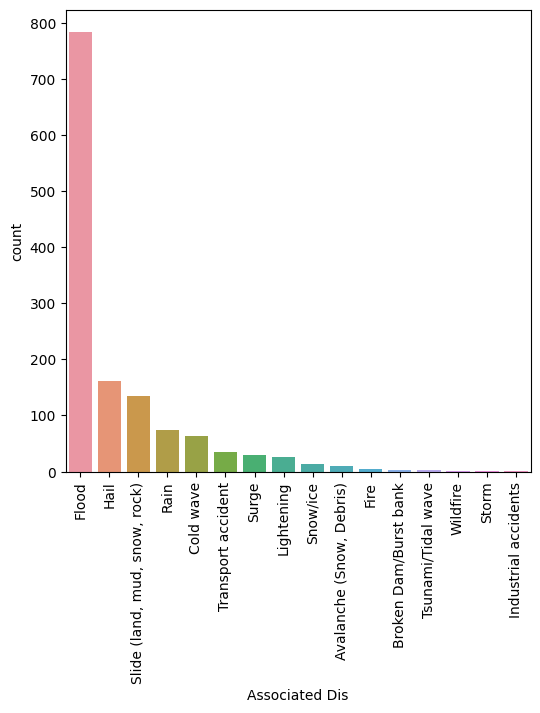

In [36]:
plt.figure(figsize=(6,6))
order = df_storm['Associated Dis'].value_counts(ascending=False).index
sns.countplot(data=df_storm, x='Associated Dis', order=order)
plt.xticks(rotation=90);

De los 16 tipos de  desastres asociados que llevan aparejadas las tormentas el porcentaje más alto con mucha diferencia corresponde a las inundaciones. A muchísima distancia le sigue el granizo y el deslizamiento(de tierra,lodo, nieve o rocas)

In [37]:
df_storm_impact = df_storm[['Total Deaths', 'Total Affected', 'Total Damages Adj']]
df_storm_impact.head(5)

,Total Deaths,Total Affected,Total Damages Adj
7,0,0,0
14,10000,0,649981
18,172,0,0
19,0,0,0
22,150,0,0


In [38]:
df_storm_impact.isnull().sum()

Total Deaths         0
Total Affected       0
Total Damages Adj    0
dtype: int64

In [39]:
df_storm_impact['Total Deaths'].sum()

1403990

In [40]:
df_storm_impact['Total Deaths'].value_counts()

0         1181
1          317
2          242
3          198
4          161
6          126
5          125
7           97
11          95
10          93
12          85
9           82
8           69
15          52
14          52
13          52
20          51
18          44
16          42
25          38
22          37
100         37
26          34
17          34
30          30
28          28
33          28
50          27
19          27
31          26
24          24
21          24
40          23
23          23
29          20
27          20
32          19
36          19
42          17
41          16
47          16
200         16
45          15
35          15
39          14
34          13
1000        13
38          13
46          12
60          12
48          11
37          11
53          11
49          11
56          11
80          10
54          10
44          10
59          10
500         10
70          10
65           9
43           9
51           8
85           8
300          8
64        

In [41]:
df_storm_impact['Total Affected'].sum()

1261651818

Casi 1300 millones de personas afectadas  en 4618 eventos

In [42]:
df_storm_impact['Total Damages Adj'].sum()

2780776501

### 3.4 ANÁLISIS DE LA TEMPORALIDAD EN TORMENTAS
Usando columnas 'Year', 'Start Year', 'Start Month', 'Start Day', 'End Year', 'End Month', 'End Day'.

 * Análisis básico

In [43]:
df_storm.columns

Index(['Dis No', 'Year', 'Seq', 'Disaster Subgroup', 'Disaster Type',
       'Disaster Subtype', 'Country', 'ISO', 'Region', 'Continent', 'Location',
       'Origin', 'Associated Dis', 'Dis Mag Value', 'Dis Mag Scale',
       'Latitude', 'Longitude', 'Start Year', 'Start Month', 'Start Day',
       'End Year', 'End Month', 'End Day', 'Total Deaths', 'Total Affected',
       'Total Damages Adj'],
      dtype='object')

In [45]:
df_storm_year = df_storm[['Year', 'Start Year', 'Start Month', 'Start Day', 'End Year', 'End Month', 'End Day']]
df_storm_year.head(5)

,Year,Start Year,Start Month,Start Day,End Year,End Month,End Day
7,1904,1904,11,0,1904,11,0
14,1906,1906,9,8,1906,9,8
18,1909,1909,10,15,1909,10,15
19,1909,1909,12,0,1909,12,0
22,1909,1909,11,12,1909,11,12


In [46]:
df_storm_year.isnull().sum()

Year           0
Start Year     0
Start Month    0
Start Day      0
End Year       0
End Month      0
End Day        0
dtype: int64

In [47]:
df_storm_year[['Start Year','End Year']].value_counts()

Start Year  End Year
1990        1990        135
2017        2017        129
2005        2005        129
2020        2020        126
2004        2004        124
2002        2002        122
2015        2015        121
2021        2021        121
2008        2008        112
2022        2022        108
1993        1993        107
1999        1999        106
2013        2013        105
2001        2001        105
2007        2007        104
2000        2000        102
2014        2014         99
2018        2018         95
2019        2019         92
2010        2010         91
2012        2012         91
1998        1998         88
2009        2009         87
2003        2003         86
2016        2016         85
2011        2011         84
1995        1995         80
1994        1994         80
1997        1997         78
1996        1996         76
1992        1992         76
2006        2006         76
1989        1989         72
1991        1991         66
1988        1988         60

El mayor número de tormentas se produjeron en los años 1990 seguido del 2017 y 2005. Casi tota la mayoria de eventos esta´n contabilizados a partir de la década de los 80 en adelante.

## ANÁLISIS BIVARIANTE

In [48]:
df_storm.groupby('Continent')['Total Deaths'].value_counts()

Continent  Total Deaths
Africa     0                85
           1                21
           3                19
           2                15
           10               12
           4                10
           9                 9
           11                9
           5                 7
           12                7
           14                6
           7                 5
           8                 5
           13                5
           18                4
           20                4
           6                 3
           15                3
           17                3
           23                3
           35                3
           42                3
           53                3
           100               3
           21                2
           22                2
           25                2
           29                2
           30                2
           31                2
           33                2
           64  

In [49]:
a = df_storm.groupby('Continent')['Total Deaths'].sum().reset_index()
a

,Continent,Total Deaths
0,Africa,8328
1,Americas,107966
2,Asia,1281591
3,Europe,3812
4,Oceania,2293


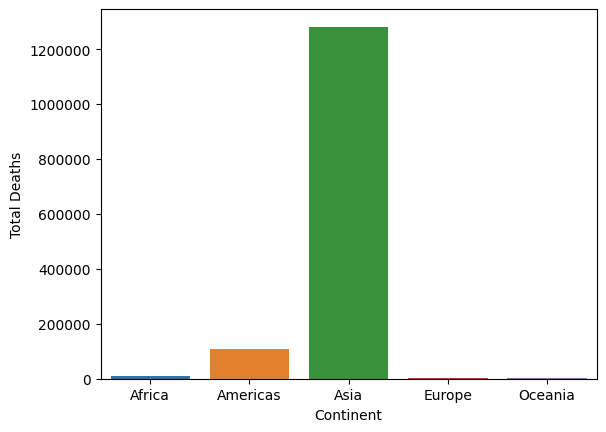

In [50]:
sns.barplot(data=a, x='Continent', y = 'Total Deaths')
plt.ticklabel_format(style='plain', axis='y')

In [51]:
df_storm.groupby('Continent')['Start Year'].value_counts()

Continent  Start Year
Africa     2022          16
           2002          14
           2000          13
           2009          13
           2003          11
           2012          11
           2015          11
           2019          11
           2021          11
           2008          10
           2017          10
           1999           9
           2007           9
           2011           9
           1984           8
           1994           8
           2004           7
           2018           7
           2023           7
           2001           6
           2005           6
           2010           6
           2013           6
           2014           6
           1989           5
           1996           5
           2006           5
           2020           5
           1975           4
           1982           4
           1983           4
           1987           4
           1988           4
           1993           4
           1997           

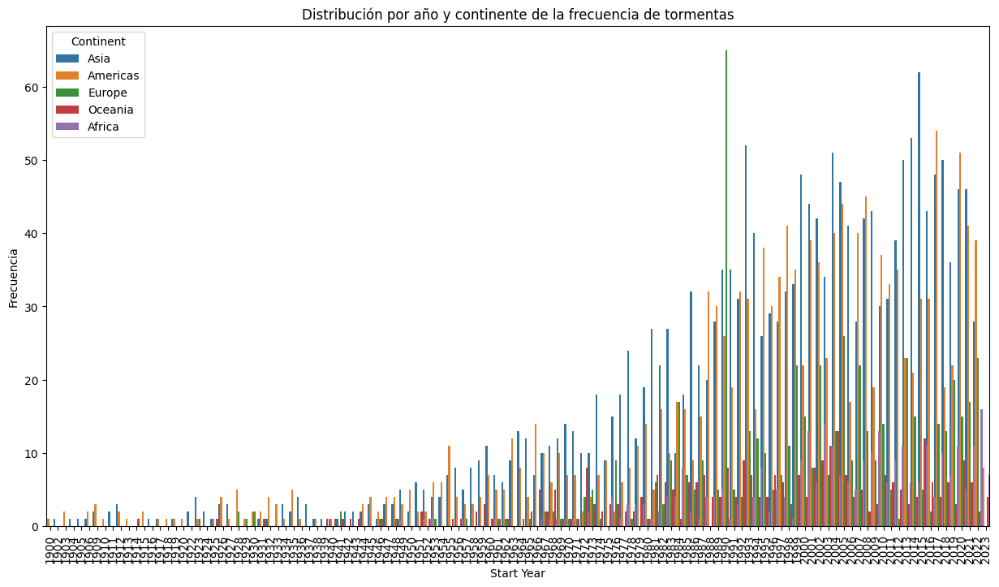

In [52]:
plt.figure(figsize=(15,8))
sns.countplot(data=df_storm, x='Start Year', hue='Continent', width=1.2)
plt.xticks(rotation=90)
plt.ylabel('Frecuencia')
plt.title('Distribución por año y continente de la frecuencia de tormentas');

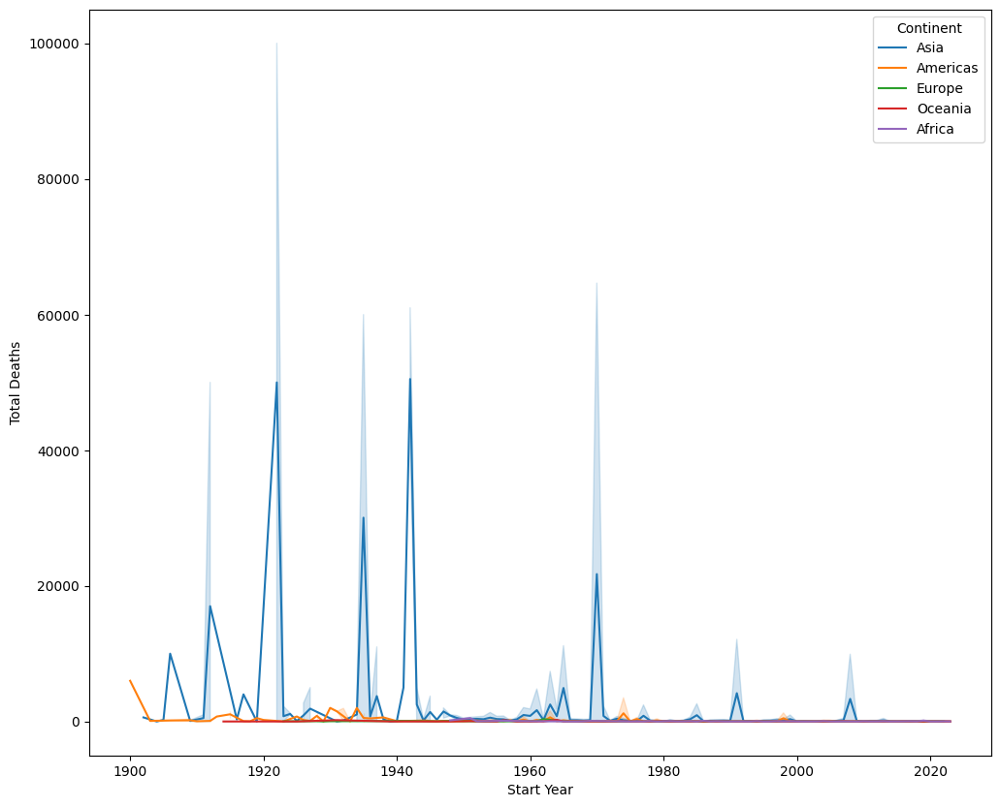

In [53]:
plt.figure(figsize=(12,10))
sns.lineplot(data=df_storm, x='Start Year', y='Total Deaths', hue='Continent')
plt.ticklabel_format(style='plain', axis='y')

In [55]:
df_storm.groupby('Continent')['Total Affected'].sum()

Continent
Africa        27323053
Americas     170829472
Asia        1045657418
Europe         9048365
Oceania        8793510
Name: Total Affected, dtype: int64

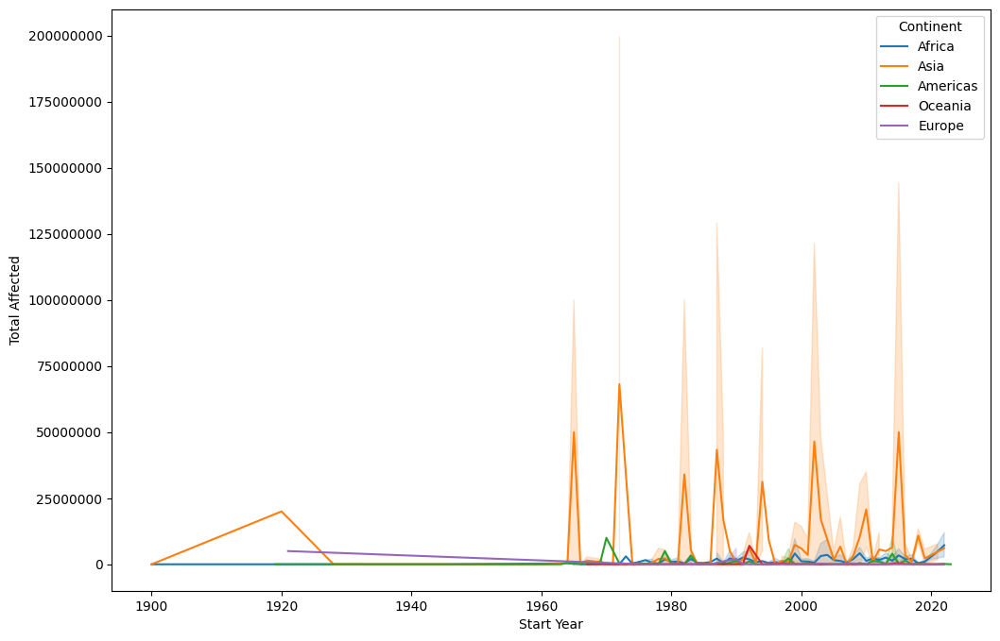

In [ ]:
plt.figure(figsize=(12,8))
sns.lineplot(data=df_storm, x='Start Year', y='Total Affected', hue='Continent')
plt.ticklabel_format(style='plain', axis='y')

In [ ]:
df_storm['Total Deaths'].isnull().sum()

0

In [57]:
df_storm_deaths_affected = df_storm[['Total Affected','Total Deaths']]
df_storm_deaths_affected

,Total Affected,Total Deaths
7,0,0
14,0,10000
18,0,172
19,0,0
22,0,150
32,0,0
35,2700,28
36,0,50000
40,0,1600
41,0,300


In [58]:
df_storm_deaths_affected.shape

(4618, 2)

In [ ]:
#df_drought_deaths_affected_sinnulos = df_drought_deaths_affected.dropna(axis=0)
#df_drought_deaths_affected_sinnulos

In [59]:
df_storm['Total Deaths'].shape

(4618,)

In [60]:
df_storm['Total Deaths'].isnull().sum()

0

In [61]:
a = df_storm[['Total Deaths', 'Country', 'Continent', 'Start Year']].value_counts(dropna=True)
a

Total Deaths  Country                                                     Continent  Start Year
0             United States of America (the)                              Americas   1992          22
                                                                                     1988          16
                                                                                     1997          14
                                                                                     1993          13
                                                                                     1991          11
                                                                                     1989          11
                                                                                     1990           9
                                                                                     2001           8
              China                                                       Asia       201

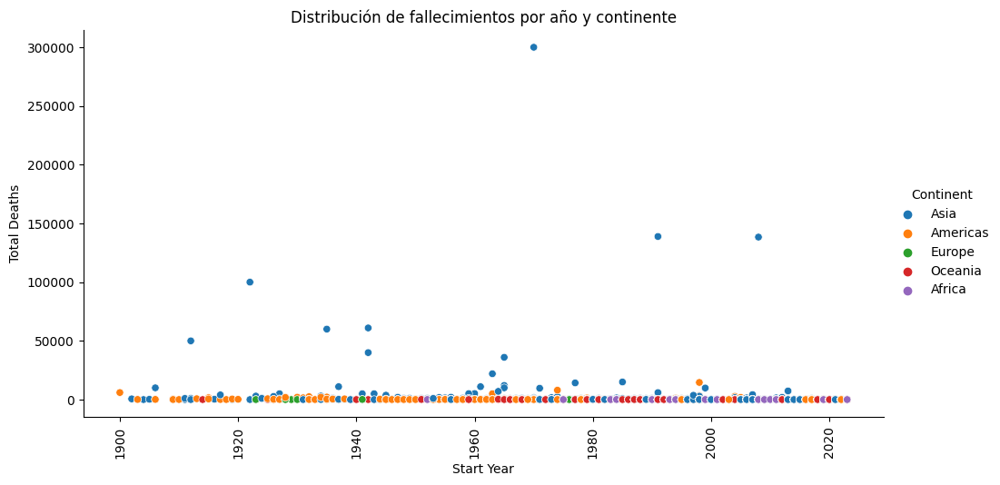

In [62]:
sns.relplot(data=df_storm, x='Start Year', y='Total Deaths', hue="Continent", height=5, aspect=2)
plt.ticklabel_format(style='plain')
plt.xticks(rotation=90)
plt.title('Distribución de fallecimientos por año y continente');

In [63]:
#filtrar para un número de fallecimientos inferior a 150.000 personas
filter = df_storm_deaths_affected['Total Deaths'] < 150000
df_mediomillon_deaths = df_storm_deaths_affected[filter]
df_mediomillon_deaths.reset_index()


,index,Total Affected,Total Deaths
0,7,0,0
1,14,0,10000
2,18,0,172
3,19,0,0
4,22,0,150
5,32,0,0
6,35,2700,28
7,36,0,50000
8,40,0,1600
9,41,0,300


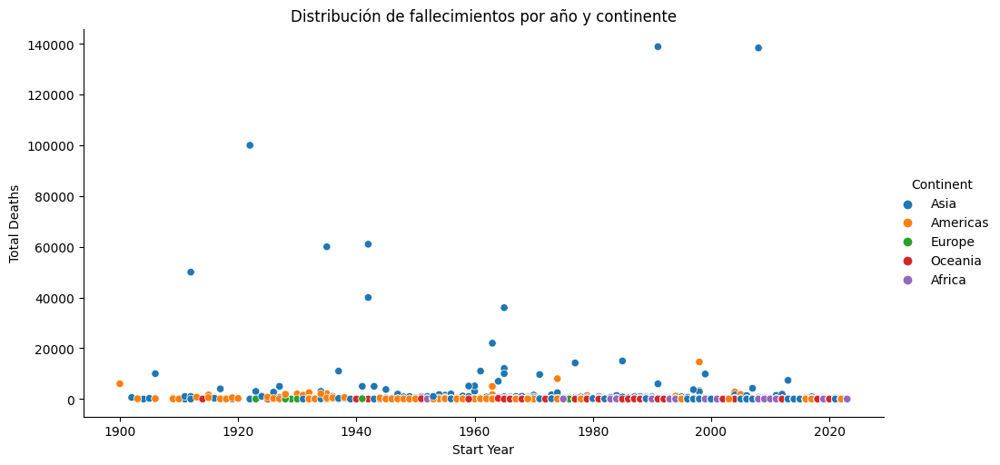

In [64]:
sns.relplot(data=df_storm, x='Start Year', y=df_mediomillon_deaths['Total Deaths'], hue="Continent", height=5, aspect=2)
plt.ticklabel_format(style='plain')
plt.title('Distribución de fallecimientos por año y continente');

In [65]:
df_storm_numeric= df_storm[['Start Year','End Year', 'Total Deaths', 'Total Affected', 'Total Damages Adj']]

<Axes: >

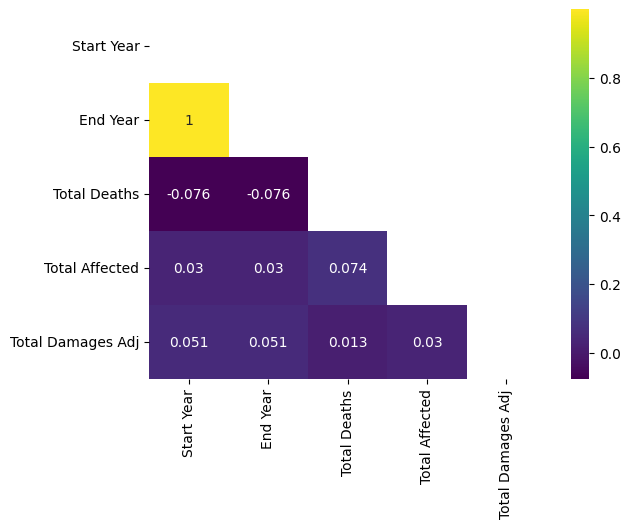

In [66]:

df_corr = df_storm_numeric.corr(numeric_only=True)
filter = np.triu(df_corr)
sns.heatmap(df_corr, annot=True, cmap="viridis", mask = filter)

In [67]:
df_mediomillon_deaths.reset_index()


,index,Total Affected,Total Deaths
0,7,0,0
1,14,0,10000
2,18,0,172
3,19,0,0
4,22,0,150
5,32,0,0
6,35,2700,28
7,36,0,50000
8,40,0,1600
9,41,0,300


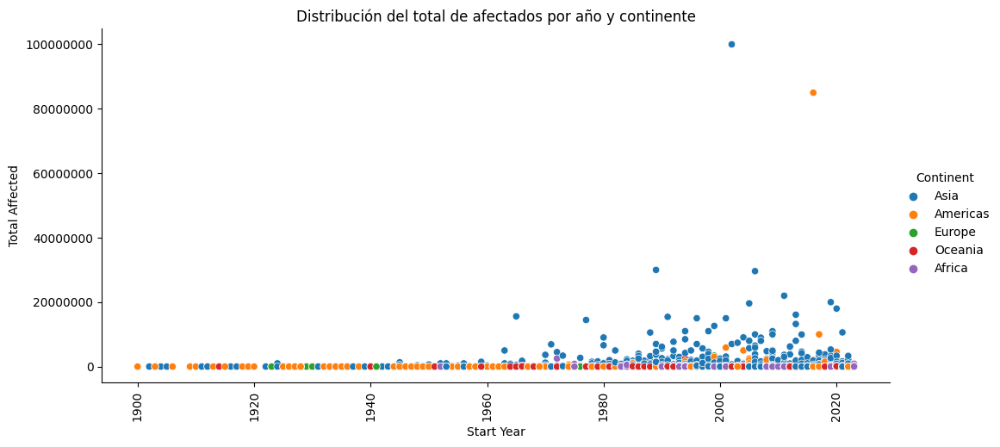

In [68]:
sns.relplot(data=df_storm, x='Start Year', y='Total Affected', hue="Continent", height=5, aspect=2)
plt.ticklabel_format(style='plain')
plt.xticks(rotation=90)
plt.title('Distribución del total de afectados por año y continente');

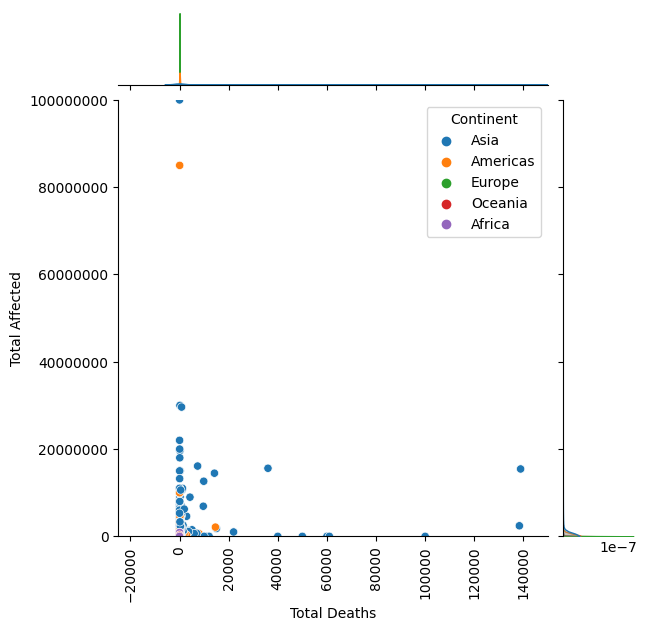

In [69]:
sns.jointplot(data=df_storm, x='Total Deaths', y='Total Affected', hue='Continent', dropna=False)
plt.ticklabel_format(style='plain')
plt.xticks(rotation=90)
plt.xlim(-25000, 150000)
plt.ylim(0,100000000);

In [8]:
a = df_storm[['Total Deaths', 'Total Affected', 'Total Damages Adj', 'Dis Mag Value']].reset_index()
a

,index,Total Deaths,Total Affected,Total Damages Adj,Dis Mag Value
0,7,0,0,0,0
1,14,10000,0,649981,0
2,18,172,0,0,0
3,19,0,0,0,0
4,22,150,0,0,0
5,32,0,0,0,0
6,35,28,2700,151289,0
7,36,50000,0,0,0
8,40,1600,0,0,0
9,41,300,0,0,0
